<h1>Classification Demonstration</h1>

In [26]:
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix

In [29]:
def DisplayConfusionMatrix(matrix):
    labels = ['True Neg','False Pos','False Neg','True Pos']
    accuracy  = np.trace(matrix) / float(np.sum(matrix))
    precision = matrix[1,1] / sum(matrix[:,1])
    specificity = matrix[0,0] / sum(matrix[0,:])
    recall    = matrix[1,1] / sum(matrix[1,:])
    f1_score  = 2*precision*recall / (precision + recall)
    stats_text = "\n\nAccuracy={:0.3f}\nPrecision={:0.3f}\nSpecificity (TN Rate)={:0.3f}\nRecall (TP Rate)={:0.3f}\nF1 Score={:0.3f}".format(
    accuracy,precision,specificity,recall,f1_score)


    group_labels = ["{}\n".format(value) for value in labels]
    group_counts = ["{0:0.0f}\n".format(value) for value in matrix.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in matrix.flatten()/np.sum(matrix)]

    box_labels = [f"{v1}{v2}{v3}".strip() for v1, v2, v3 in zip(group_labels,group_counts,group_percentages)]
    box_labels = np.asarray(box_labels).reshape(matrix.shape[0],matrix.shape[1])

    sns.set(font_scale = 2)
    ax = sns.heatmap(matrix,annot=box_labels, fmt='', cmap='Blues')
    _ = ax.set(xlabel='Predicted' + stats_text, ylabel='Truth', title='Confusion Matrix')

<H3>Generate the sample data</H3>

In [21]:
rng = np.random.RandomState(0)

X, y = make_classification(n_features=10, shuffle=False, n_samples=1000, random_state=rng)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=rng)
print(X.shape, y.shape)
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(1000, 10) (1000,)
(670, 10) (670,)
(330, 10) (330,)


In [14]:
print(X[:2], y[:2])

[[ 0.29451814 -1.70693551  0.50623059  0.08385291  1.66060756 -1.41660348
  -2.8022028  -1.18842442 -0.60383955 -1.14955406]
 [ 0.12031418 -1.674137    0.62727001  0.14243852  1.09830354 -0.13783918
   0.0253856   0.61039176  0.28601253  0.9785673 ]] [0 0]


<H3>Exploratory Data Analysis</H3>

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', 'label'], dtype='object')


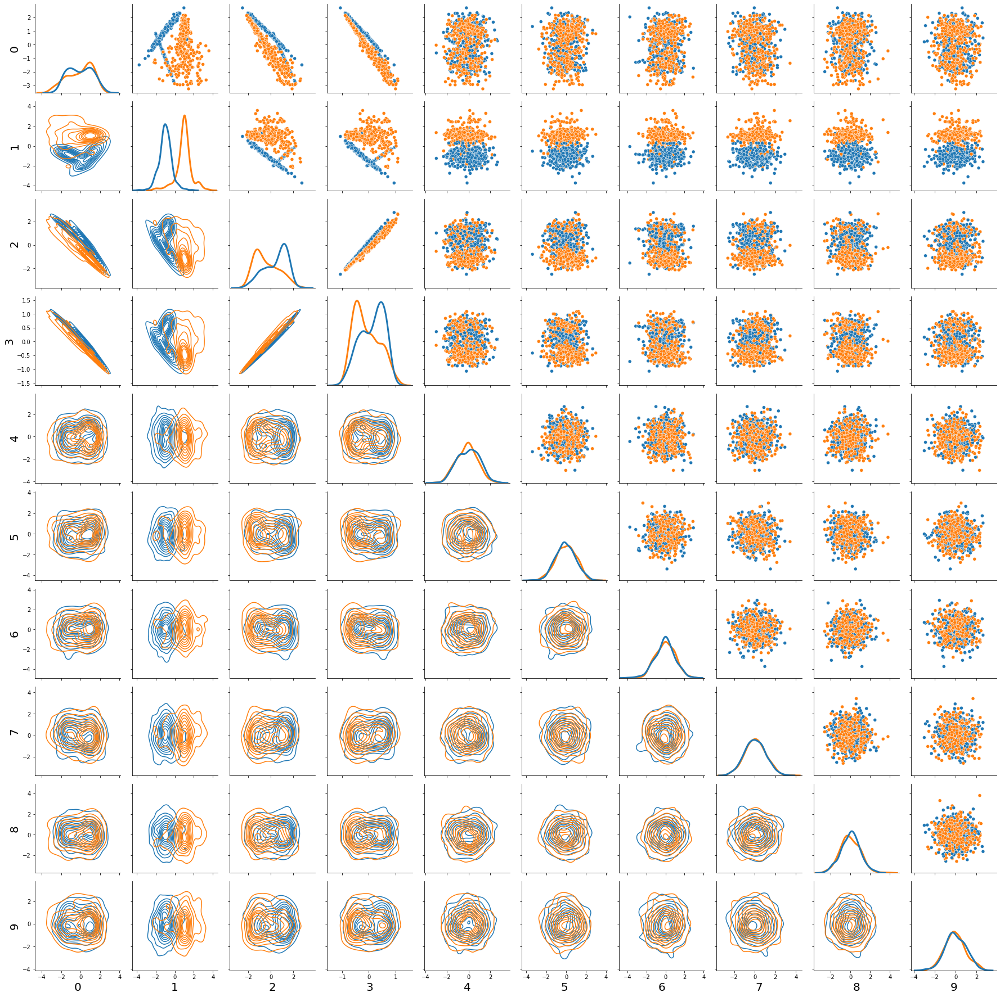

In [16]:
data = pd.DataFrame(np.hstack((X,y.reshape(-1,1))))
data.columns = list(data.columns.astype(str))
data.rename(columns={'10':'label'}, inplace=True)
print(data.columns)
g = sns.PairGrid(data, hue='label')
g.map_upper(sns.scatterplot)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot, lw=3, legend=False)
for i, axes_row in enumerate(g.axes):
    for j, axes_col in enumerate(axes_row):
        axes_col.set_xlabel(axes_col.get_xlabel(), fontsize=20)
        axes_col.set_ylabel(axes_col.get_ylabel(), fontsize=20)

In [38]:
data.describe()

,0,1,2,3,4,5,6,7,8,9,label
count,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000
mean,-0.057704,-0.014734,0.051112,0.022241,-0.085693,-0.033875,-0.027114,0.046473,0.011503,-0.010853,0.498571
std,1.274871,1.224150,1.136809,0.479591,0.977707,0.987864,1.005303,1.002678,0.969607,0.987181,0.500355
min,-3.249827,-3.742080,-2.507452,-1.070108,-3.006499,-3.392300,-3.740101,-2.615371,-2.593389,-3.007437,0.000000
25%,-1.142175,-1.014666,-0.998346,-0.392313,-0.789756,-0.713471,-0.713730,-0.630735,-0.643444,-0.666471,0.000000
50%,0.089702,-0.195844,0.044366,0.033204,-0.049809,-0.037894,-0.018159,0.026375,0.008086,-0.089057,0.000000
75%,0.991220,1.014719,1.038851,0.438345,0.641980,0.601830,0.665684,0.732851,0.661714,0.644806,1.000000
max,2.697566,3.583918,2.768124,1.088456,2.680571,2.979976,2.929096,3.427539,3.801660,2.634603,1.000000


In [37]:
#!pip install pandas_profiling
from pandas_profiling import ProfileReport
profile = ProfileReport(data, title="Profiling Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<HR>

<H3>Classifier Exhibition</H3>

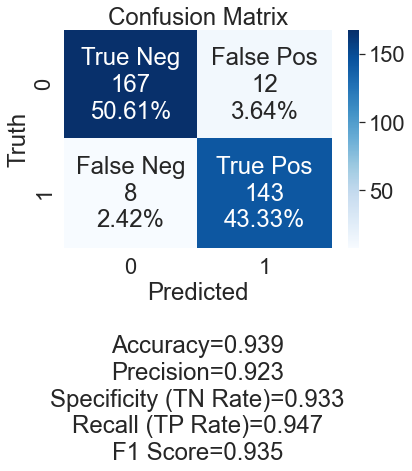

In [40]:
from sklearn.linear_model import SGDClassifier
clf = SGDClassifier()
model = clf.fit(X_train, y_train)
y_predictions = model.predict(X_test)

perf_matrix = confusion_matrix(y_test, y_predictions)
DisplayConfusionMatrix(perf_matrix)

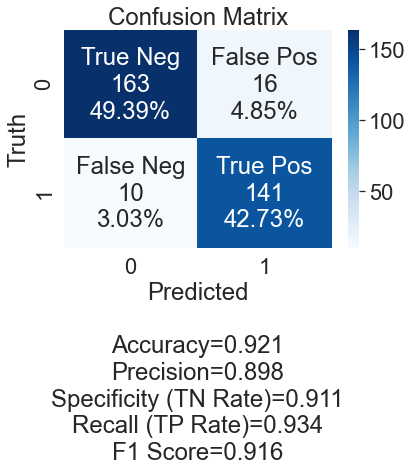

In [39]:
from sklearn.neighbors import KNeighborsClassifier
clf = KNeighborsClassifier()
model = clf.fit(X_train, y_train)
y_predictions = model.predict(X_test)

perf_matrix = confusion_matrix(y_test, y_predictions)
DisplayConfusionMatrix(perf_matrix)

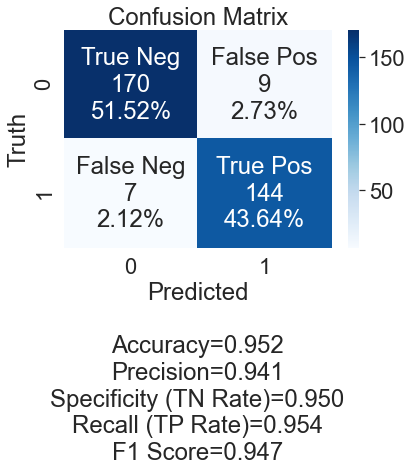

In [41]:
from sklearn.svm import SVC
clf = SVC()
model = clf.fit(X_train, y_train)
y_predictions = model.predict(X_test)

perf_matrix = confusion_matrix(y_test, y_predictions)
DisplayConfusionMatrix(perf_matrix)

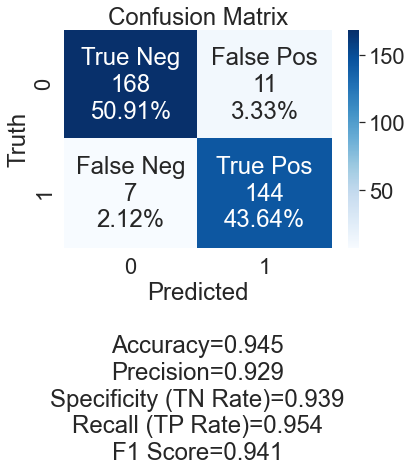

In [43]:
from sklearn.linear_model import LogisticRegression
clf = LogisticRegression()
model = clf.fit(X_train, y_train)
y_predictions = model.predict(X_test)

perf_matrix = confusion_matrix(y_test, y_predictions)
DisplayConfusionMatrix(perf_matrix)

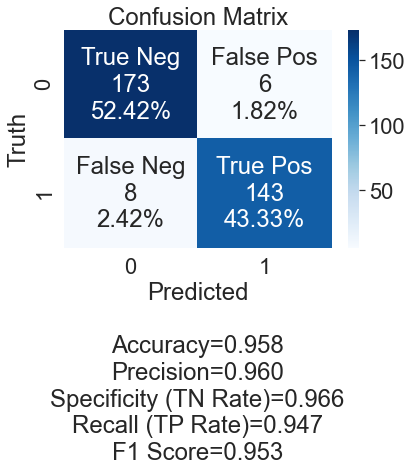

In [44]:
from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier()
model = clf.fit(X_train, y_train)
y_predictions = model.predict(X_test)

perf_matrix = confusion_matrix(y_test, y_predictions)
DisplayConfusionMatrix(perf_matrix)

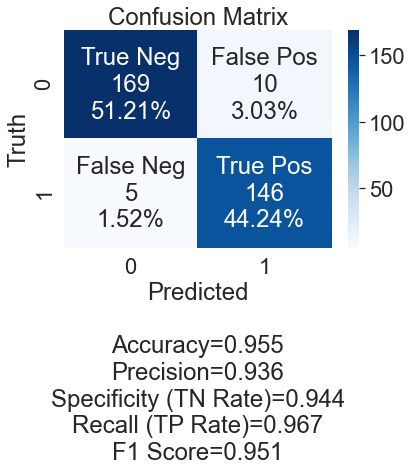

In [45]:
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier()
model = clf.fit(X_train, y_train)
y_predictions = model.predict(X_test)

perf_matrix = confusion_matrix(y_test, y_predictions)
DisplayConfusionMatrix(perf_matrix)

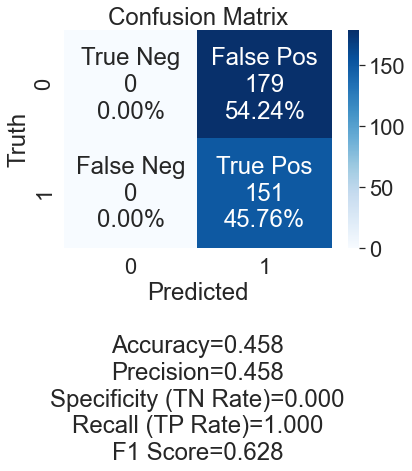

In [47]:
# MultinomialNB does not work with negative feature variable values so transform them with MinMaxScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import make_pipeline
from sklearn.naive_bayes import MultinomialNB

clf = make_pipeline(MinMaxScaler(), MultinomialNB())
model = clf.fit(X_train, y_train)
y_predictions = model.predict(MinMaxScaler().fit_transform(X_test))

perf_matrix = confusion_matrix(y_test, y_predictions)
DisplayConfusionMatrix(perf_matrix)

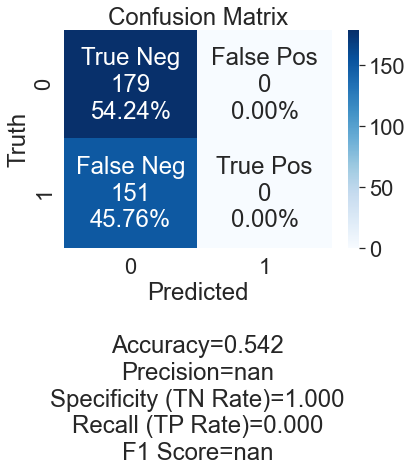

In [49]:
#!pip install mlxtend
from mlxtend.classifier import OneRClassifier
clf = OneRClassifier()
model = clf.fit(X_train, y_train)
y_predictions = model.predict(X_test)

perf_matrix = confusion_matrix(y_test, y_predictions)
DisplayConfusionMatrix(perf_matrix)

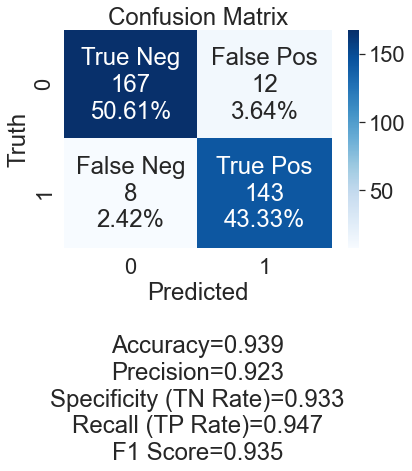

In [50]:
from sklearn.linear_model import PassiveAggressiveClassifier
clf = PassiveAggressiveClassifier()
model = clf.fit(X_train, y_train)
y_predictions = model.predict(X_test)

perf_matrix = confusion_matrix(y_test, y_predictions)
DisplayConfusionMatrix(perf_matrix)